In [0]:
!nvidia-smi

Thu May 21 23:16:56 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.82       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
!pip uninstall scipy

In [0]:
!pip install scipy==1.1.0

In [0]:
!pip install watermark

In [0]:
import os
import tensorflow as tf
from tensorflow.keras.datasets import cifar10
import matplotlib.pyplot as plt
import zipfile
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#modulos para red
from tensorflow.keras.layers import Dense, Input, Activation, BatchNormalization, UpSampling2D, Flatten, Conv2D, Conv2DTranspose, LeakyReLU,PReLU, add, ReLU
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.utils import plot_model

#manipulación de datos
import numpy as np
import pandas as pd

#manipulación de imagenes
from skimage import io, segmentation as seg
from skimage.transform import resize
from PIL import Image
from scipy.misc import imresize

#visualización de imagenes
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import scipy

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
%reload_ext watermark
%watermark -a "Christian Dayan Arcos Gordillo" --iversion

numpy      1.18.4
PIL.Image  7.0.0
pandas     1.0.3
matplotlib 3.2.1
tensorflow 2.2.0
seaborn    0.10.1
scipy      1.1.0
Christian Dayan Arcos Gordillo


In [0]:
!wget  --no-check-certificate https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip -O ./cats_and_dogs_filtered.zip

In [0]:
dataset_path = "./cats_and_dogs_filtered.zip"
zip_object = zipfile.ZipFile(file=dataset_path,mode='r')
zip_object.extractall('./')
zip_object.close()

In [0]:
dataset_path_new = "./cats_and_dogs_filtered/"
train_dir = os.path.join(dataset_path_new,"train/dogs/")
validation_dir = os.path.join(dataset_path_new,"validation")

In [0]:
height = 384
width = 384

In [0]:
def imag(path, height, width):
    
    #lista para cargar imágenes
    images=[]
    
    for image in os.listdir(path):#[:500]:
        
        #cargar la imágen
        image = io.imread(path + image)
        
        if len(image.shape)<3:
          print("las imagenes no tienen el mismo shape")
          sys.exit()
        
        #convertir en un array
        image_from_array = Image.fromarray(image)
        
        #redimensionando la imágen 
        size_image = image_from_array.resize((height,width))
        
        #Adicionar la imágen a la lista de imágenes
        images.append(np.array(size_image))

    return images

In [0]:
def denormalize(input_data):
    input_data = (input_data + 1) * 127.5
    return input_data.astype(np.uint8) 

In [0]:
def imag_lr_hr(images_in,downscale=None,hr=False):

  if hr:
    images = np.array(images_in)
    images= (images.astype('float32')-127.5)/127.5

  else:
    images= []
    for idx in range(len(images_in)):
      images.append(imresize(images_in[idx], [images_in[idx].shape[0]//downscale,images_in[idx].shape[1]//downscale],interp = 'bicubic', mode=None ))
    images = np.array(images)
    images= (images.astype('float32')-127.5)/127.5
           
  return images

In [0]:
images= imag(train_dir, height, width)

In [0]:
images_train = images[:800]
images_test = images[800:]

In [0]:
x_train_hr = imag_lr_hr(images_train, hr=True)
x_train_lr = imag_lr_hr(images_train,downscale=4)
x_test_hr = imag_lr_hr(images_test, hr=True)
x_test_lr = imag_lr_hr(images_test, downscale=4)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  # Remove the CWD from sys.path while we load stuff.


In [0]:
print('train_hr sahpe ', x_train_hr.shape)
print('train_lr sahpe ', x_train_lr.shape)
print('test_hr sahpe ', x_test_hr.shape)
print('test_lr  sahpe ', x_test_lr.shape)

train_hr sahpe  (800, 384, 384, 3)
train_lr sahpe  (800, 96, 96, 3)
test_hr sahpe  (200, 384, 384, 3)
test_lr  sahpe  (200, 96, 96, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


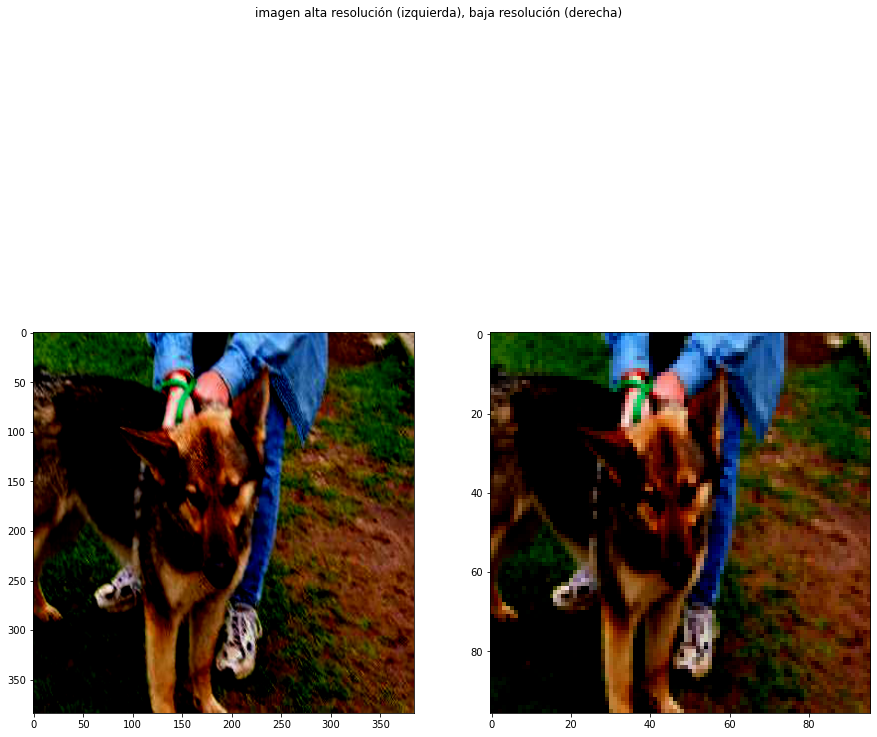

In [0]:

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,15))
fig.suptitle('imagen alta resolución (izquierda), baja resolución (derecha)')
ax1.imshow(x_train_hr[6])
ax2.imshow(x_train_lr[6])

plt.show()

In [0]:
def res_block_gen(model, kernal_size, filters, strides):
    
    gen = model
    
    model = Conv2D(filters = filters, kernel_size = kernal_size, strides = strides, padding = "same")(model)
    model = BatchNormalization(momentum = 0.5)(model)
    model = PReLU(alpha_initializer='zeros', alpha_regularizer=None, alpha_constraint=None, shared_axes=[1,2])(model)
    model = Conv2D(filters = filters, kernel_size = kernal_size, strides = strides, padding = "same")(model)
    model = BatchNormalization(momentum = 0.5)(model)
        
    model = add([gen, model])
    
    return model

In [0]:
def up_sampling_block(model, kernal_size, filters, strides):

    model = Conv2D(filters = filters, kernel_size = kernal_size, strides = strides, padding = "same")(model)
    model = UpSampling2D(size = 2)(model)
    model = LeakyReLU(alpha = 0.2)(model)
    
    return model

In [0]:
def discriminator_block(model, filters, kernel_size, strides):
    
    model = Conv2D(filters = filters, kernel_size = kernel_size, strides = strides, padding = "same")(model)
    model = BatchNormalization(momentum = 0.5)(model)
    model = LeakyReLU(alpha = 0.2)(model)
    
    return model

In [0]:
class Generator(object):

    def __init__(self, noise_shape):
        
        self.noise_shape = noise_shape

    def generator(self):
        
	    gen_input = Input(shape = self.noise_shape)
	    
	    model = Conv2D(filters = 64, kernel_size = 9, strides = 1, padding = "same")(gen_input)
	    model = PReLU(alpha_initializer='zeros', alpha_regularizer=None, alpha_constraint=None, shared_axes=[1,2])(model)
	    
	    gen_model = model
        
        # Using 16 Residual Blocks
	    for index in range(16):
	        model = res_block_gen(model, 3, 64, 1)
	    
	    model = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = "same")(model)
	    model = BatchNormalization(momentum = 0.5)(model)
	    model = add([gen_model, model])
	    
	    # Using 2 UpSampling Blocks
	    for index in range(2):
	        model = up_sampling_block(model, 3, 256, 1)
	    
	    model = Conv2D(filters = 3, kernel_size = 9, strides = 1, padding = "same")(model)
	    model = Activation('tanh')(model)
	   
	    generator_model = Model(inputs = gen_input, outputs = model)
        
	    return generator_model
    

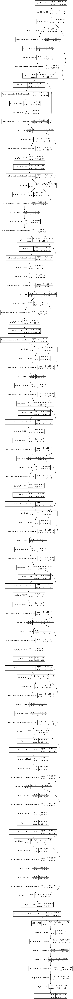

In [0]:
generator = Generator((96,96,3)).generator()
plot_model(generator,show_shapes=True)

In [0]:
generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 96, 96, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 96, 96, 64)   15616       input_1[0][0]                    
__________________________________________________________________________________________________
p_re_lu (PReLU)                 (None, 96, 96, 64)   64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 96, 96, 64)   36928       p_re_lu[0][0]                    
______________________________________________________________________________________________

In [0]:
class Discriminator(object):

    def __init__(self, image_shape):
        
        self.image_shape = image_shape
    
    def discriminator(self):
        
        dis_input = Input(shape = self.image_shape)
        
        model = Conv2D(filters = 64, kernel_size = 3, strides = 1, padding = "same")(dis_input)
        model = LeakyReLU(alpha = 0.2)(model)
        
        model = discriminator_block(model, 64, 3, 2)
        model = discriminator_block(model, 128, 3, 1)
        model = discriminator_block(model, 128, 3, 2)
        model = discriminator_block(model, 256, 3, 1)
        model = discriminator_block(model, 256, 3, 2)
        model = discriminator_block(model, 512, 3, 1)
        model = discriminator_block(model, 512, 3, 2)
        
        model = Flatten()(model)
        model = Dense(1024)(model)
        model = LeakyReLU(alpha = 0.2)(model)
       
        model = Dense(1)(model)
        model = Activation('sigmoid')(model) 
        
        discriminator_model = Model(inputs = dis_input, outputs = model)
        
        return discriminator_model


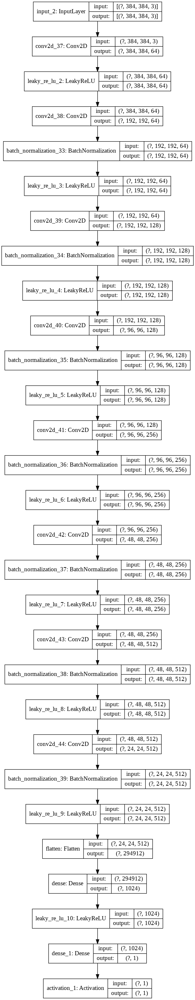

In [0]:
discriminator = Discriminator((384,384,3)).discriminator()
discriminator.compile(loss="binary_crossentropy", optimizer='adam')
plot_model(discriminator,show_shapes=True)

In [0]:
discriminator.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 384, 384, 3)]     0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 384, 384, 64)      1792      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 384, 384, 64)      0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 192, 192, 64)      36928     
_________________________________________________________________
batch_normalization_33 (Batc (None, 192, 192, 64)      256       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 192, 192, 64)      0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 192, 192, 128)     7385

In [0]:
#optimizador usado VGG19
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.optimizers import Adam
import keras.backend as K

np.random.seed(10)
image_shape = (384,384,3)
vgg19 = VGG19(include_top=False, weights='imagenet', input_shape=image_shape)
vgg19.trainable = False
def vgg_loss(y_true, y_pred):
    loss_model = Model(inputs=vgg19.input, outputs=vgg19.get_layer('block5_conv4').output)
    loss_model.trainable = False
    return K.mean(K.square(loss_model(y_true) - loss_model(y_pred)))



Using TensorFlow backend.


80142336/80134624 [==============================] - 1s 0us/step


In [0]:
def get_gan_network(discriminator, shape, generator, optimizer):
    discriminator.trainable = False
    gan_input = Input(shape=shape)
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(inputs=gan_input, outputs=[x,gan_output])
    gan.compile(loss=[vgg_loss, "binary_crossentropy"],
                loss_weights=[1., 1e-3],
                optimizer=optimizer)

    return gan

In [0]:
import shutil
if os.path.isdir(os.getcwd() +'/output'):
  print('directorio ya existe... removiendo y creando uno nuevo...')
  shutil.rmtree(os.getcwd() + '/output')
  os.makedirs(os.getcwd() + '/output')
else:
  os.makedirs(os.getcwd() + '/output')

In [0]:
def plot_generated_images(epoch,generator, examples=3 , dim=(1, 3), figsize=(15, 5)):
    
    rand_nums = np.random.randint(0, x_test_hr.shape[0], size=examples)
    image_batch_hr = denormalize(x_test_hr[rand_nums])
    image_batch_lr = x_test_lr[rand_nums]
    gen_img = generator.predict(image_batch_lr)
    generated_image = denormalize(gen_img)
    image_batch_lr = denormalize(image_batch_lr)
    
    #generated_image = deprocess_HR(generator.predict(image_batch_lr))
    
    plt.figure(figsize=figsize)
    
    plt.subplot(dim[0], dim[1], 1)
    plt.imshow(image_batch_lr[1], interpolation='nearest')
    plt.legend('Imágen de baja resolución')
    plt.axis('off')
        
    plt.subplot(dim[0], dim[1], 2)
    plt.imshow(generated_image[1], interpolation='nearest')
    plt.legend('Imágen econstruida')
    plt.axis('off')
    
    plt.subplot(dim[0], dim[1], 3)
    plt.imshow(image_batch_hr[1], interpolation='nearest')
    plt.legend('Imágen Original de alta resolución')
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('./output/gan_generated_image_epoch_%d.png' % epoch)

In [0]:
#Entrenamiento

from tqdm import tqdm
import numpy as np
import argparse
image_shape = (384,384,3)
downscale_factor=4

def train(epochs=1, batch_size=128):

    downscale_factor = 4
    
    batch_count = int(x_train_hr.shape[0] / batch_size)
    shape = (image_shape[0]//downscale_factor, image_shape[1]//downscale_factor, image_shape[2])
    
    generator = Generator(shape).generator()
    discriminator = Discriminator(image_shape).discriminator()

    adam = Adam(lr=1E-4, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    generator.compile(loss=vgg_loss, optimizer=adam)
    discriminator.compile(loss="binary_crossentropy", optimizer=adam)
    
    shape = (image_shape[0]//downscale_factor, image_shape[1]//downscale_factor, 3)
    gan = get_gan_network(discriminator, shape, generator, adam)

    for e in range(1, epochs+1):
        print ('*'*15, 'Epoch %d' % e, '*'*15, '\n')
        for _ in tqdm(range(batch_count)):
            
            rand_nums = np.random.randint(0, x_train_hr.shape[0], size=batch_size)
            
            image_batch_hr = x_train_hr[rand_nums]
            image_batch_lr = x_train_lr[rand_nums]
            generated_images_sr = generator.predict(image_batch_lr)

            real_data_Y = np.ones(batch_size) - np.random.random_sample(batch_size)*0.2
            fake_data_Y = np.random.random_sample(batch_size)*0.2
            
            discriminator.trainable = True
            
            d_loss_real = discriminator.train_on_batch(image_batch_hr, real_data_Y)
            d_loss_fake = discriminator.train_on_batch(generated_images_sr, fake_data_Y)
            d_loss = 0.5 * np.add(d_loss_fake, d_loss_real)
            
            rand_nums = np.random.randint(0, x_train_hr.shape[0], size=batch_size)
            image_batch_hr = x_train_hr[rand_nums]
            image_batch_lr = x_train_lr[rand_nums]

            gan_Y = np.ones(batch_size) - np.random.random_sample(batch_size)*0.2
            discriminator.trainable = False
            loss_gan = gan.train_on_batch(image_batch_lr, [image_batch_hr,gan_Y])
            
        print('Discriminator loss : {} \n'.format(d_loss))
        print("Loss HR , Loss LR, Loss GAN")
        print(d_loss_real, d_loss_fake, loss_gan)

        if e == 1 or e % 10 == 0:
            plot_generated_images(e, generator)
        if e % 100 == 0:
            generator.save('./output/gen_model%d.h5' % e)
            discriminator.save('./output/dis_model%d.h5' % e)
            gan.save('./output/gan_model%d.h5' % e)





  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 1 *************** 




100%|██████████| 100/100 [05:04<00:00,  3.05s/it]


Discriminator loss : 1.9994853138923645 

Loss HR , Loss LR, Loss GAN
2.384401798248291 1.614568829536438 [0.07628156989812851, 0.07477901130914688, 1.502561330795288]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 2 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 2.983423113822937 

Loss HR , Loss LR, Loss GAN
3.133247137069702 2.833599090576172 [0.055106427520513535, 0.05426410213112831, 0.8423246145248413]
*************** Epoch 3 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 4.204971551895142 

Loss HR , Loss LR, Loss GAN
4.48288106918335 3.9270620346069336 [0.05519452691078186, 0.04695211723446846, 8.24240779876709]
*************** Epoch 4 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 2.2373121976852417 

Loss HR , Loss LR, Loss GAN
2.591339588165283 1.8832848072052002 [0.04393525794148445, 0.043547555804252625, 0.3877013921737671]
*************** Epoch 5 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 1.690827190876007 

Loss HR , Loss LR, Loss GAN
1.0434404611587524 2.3382139205932617 [0.052789416164159775, 0.038222990930080414, 14.566424369812012]
*************** Epoch 6 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 1.1327223181724548 

Loss HR , Loss LR, Loss GAN
1.1254563331604004 1.1399883031845093 [0.025599753484129906, 0.024998163804411888, 0.601589024066925]
*************** Epoch 7 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 1.359727680683136 

Loss HR , Loss LR, Loss GAN
1.4913123846054077 1.2281429767608643 [0.025711916387081146, 0.024679435417056084, 1.032480001449585]
*************** Epoch 8 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 1.3056580424308777 

Loss HR , Loss LR, Loss GAN
1.4006104469299316 1.2107056379318237 [0.02429652027785778, 0.02340872772037983, 0.8877922892570496]
*************** Epoch 9 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.5390980541706085 

Loss HR , Loss LR, Loss GAN
0.41432708501815796 0.6638690233230591 [0.026422087103128433, 0.021930895745754242, 4.491191864013672]
*************** Epoch 10 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]


Discriminator loss : 1.0973692536354065 

Loss HR , Loss LR, Loss GAN
1.0754646062850952 1.1192739009857178 [0.02351132221519947, 0.020754721015691757, 2.756601333618164]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 11 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 2.04250967502594 

Loss HR , Loss LR, Loss GAN
1.018052339553833 3.066967010498047 [0.022609541192650795, 0.021789224818348885, 0.8203168511390686]
*************** Epoch 12 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.9706674814224243 

Loss HR , Loss LR, Loss GAN
0.781368613243103 1.1599663496017456 [0.021052634343504906, 0.020099885761737823, 0.9527484774589539]
*************** Epoch 13 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.5806407034397125 

Loss HR , Loss LR, Loss GAN
0.78542560338974 0.37585580348968506 [0.02096281200647354, 0.01724742352962494, 3.715388536453247]
*************** Epoch 14 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.4208628386259079 

Loss HR , Loss LR, Loss GAN
0.479219526052475 0.3625061511993408 [0.019418420270085335, 0.018606936559081078, 0.811482846736908]
*************** Epoch 15 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 2.297195166349411 

Loss HR , Loss LR, Loss GAN
0.46767038106918335 4.126719951629639 [0.017268283292651176, 0.016962654888629913, 0.3056281805038452]
*************** Epoch 16 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.45897650718688965 

Loss HR , Loss LR, Loss GAN
0.5787811875343323 0.339171826839447 [0.01732819713652134, 0.01694916933774948, 0.3790276348590851]
*************** Epoch 17 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3656370937824249 

Loss HR , Loss LR, Loss GAN
0.3989354968070984 0.33233869075775146 [0.019043469801545143, 0.018496684730052948, 0.546785831451416]
*************** Epoch 18 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.4144841432571411 

Loss HR , Loss LR, Loss GAN
0.4135169982910156 0.4154512882232666 [0.01745857298374176, 0.016567297279834747, 0.89127516746521]
*************** Epoch 19 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3642568439245224 

Loss HR , Loss LR, Loss GAN
0.3699406683444977 0.3585730195045471 [0.014505172148346901, 0.013330324552953243, 1.1748476028442383]
*************** Epoch 20 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]


Discriminator loss : 0.9451650977134705 

Loss HR , Loss LR, Loss GAN
1.5825871229171753 0.3077430725097656 [0.015442432835698128, 0.014374681748449802, 1.0677506923675537]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 21 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.505910336971283 

Loss HR , Loss LR, Loss GAN
0.6059912443161011 0.40582942962646484 [0.018760113045573235, 0.017275160178542137, 1.484952449798584]
*************** Epoch 22 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.4934779405593872 

Loss HR , Loss LR, Loss GAN
0.414206326007843 0.5727495551109314 [0.01995895430445671, 0.019267357885837555, 0.691596269607544]
*************** Epoch 23 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3649024963378906 

Loss HR , Loss LR, Loss GAN
0.35510364174842834 0.3747013509273529 [0.014647580683231354, 0.014031695201992989, 0.6158852577209473]
*************** Epoch 24 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.4756970852613449 

Loss HR , Loss LR, Loss GAN
0.3248147666454315 0.6265794038772583 [0.015909407287836075, 0.015381687320768833, 0.5277197360992432]
*************** Epoch 25 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.2985859811306 

Loss HR , Loss LR, Loss GAN
0.3221169114112854 0.27505505084991455 [0.014189798384904861, 0.012866850942373276, 1.3229470252990723]
*************** Epoch 26 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.34783998131752014 

Loss HR , Loss LR, Loss GAN
0.34507519006729126 0.350604772567749 [0.015297804027795792, 0.014321108348667622, 0.9766953587532043]
*************** Epoch 27 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.34968040883541107 

Loss HR , Loss LR, Loss GAN
0.3206244111061096 0.3787364065647125 [0.012456529773771763, 0.011729273945093155, 0.7272560596466064]
*************** Epoch 28 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.34907758235931396 

Loss HR , Loss LR, Loss GAN
0.2701186537742615 0.42803651094436646 [0.0135370884090662, 0.012667618691921234, 0.8694698810577393]
*************** Epoch 29 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.4912374019622803 

Loss HR , Loss LR, Loss GAN
0.6348369121551514 0.3476378917694092 [0.013169459067285061, 0.011798570863902569, 1.3708884716033936]
*************** Epoch 30 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]


Discriminator loss : 0.32447630167007446 

Loss HR , Loss LR, Loss GAN
0.2918413281440735 0.35711127519607544 [0.011827857233583927, 0.010859709233045578, 0.9681481122970581]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 31 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3388380706310272 

Loss HR , Loss LR, Loss GAN
0.31508588790893555 0.3625902533531189 [0.012371751479804516, 0.011181117966771126, 1.190633773803711]
*************** Epoch 32 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.36485621333122253 

Loss HR , Loss LR, Loss GAN
0.3652169108390808 0.36449551582336426 [0.014610961079597473, 0.013630763627588749, 0.9801969528198242]
*************** Epoch 33 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3534802049398422 

Loss HR , Loss LR, Loss GAN
0.3781249523162842 0.32883545756340027 [0.01501790527254343, 0.013626313768327236, 1.3915917873382568]
*************** Epoch 34 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3272875249385834 

Loss HR , Loss LR, Loss GAN
0.3535935878753662 0.30098146200180054 [0.013272469863295555, 0.012140545062720776, 1.1319247484207153]
*************** Epoch 35 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.36556898057460785 

Loss HR , Loss LR, Loss GAN
0.3581892251968384 0.3729487359523773 [0.01088906079530716, 0.009673742577433586, 1.2153186798095703]
*************** Epoch 36 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3080190196633339 

Loss HR , Loss LR, Loss GAN
0.3737829625606537 0.2422550767660141 [0.01138958428055048, 0.010319351218640804, 1.0702327489852905]
*************** Epoch 37 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.82s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.2945442348718643 

Loss HR , Loss LR, Loss GAN
0.2821485102176666 0.306939959526062 [0.012191503308713436, 0.010973594151437283, 1.217909336090088]
*************** Epoch 38 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3493546098470688 

Loss HR , Loss LR, Loss GAN
0.3729175627231598 0.3257916569709778 [0.011305469088256359, 0.010114656761288643, 1.1908119916915894]
*************** Epoch 39 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.32680797576904297 

Loss HR , Loss LR, Loss GAN
0.2711501717567444 0.38246577978134155 [0.011672422289848328, 0.010790516622364521, 0.8819059729576111]
*************** Epoch 40 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]


Discriminator loss : 0.24600669741630554 

Loss HR , Loss LR, Loss GAN
0.33909231424331665 0.15292108058929443 [0.011233044788241386, 0.009480209089815617, 1.7528358697891235]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 41 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.373741552233696 

Loss HR , Loss LR, Loss GAN
0.38072749972343445 0.3667556047439575 [0.011547381989657879, 0.009987285360693932, 1.5600965023040771]
*************** Epoch 42 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3167184293270111 

Loss HR , Loss LR, Loss GAN
0.30663132667541504 0.3268055319786072 [0.011461149901151657, 0.00999488402158022, 1.4662654399871826]
*************** Epoch 43 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.28850507736206055 

Loss HR , Loss LR, Loss GAN
0.2906942367553711 0.28631591796875 [0.011425073258578777, 0.009901680983603, 1.5233919620513916]
*************** Epoch 44 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3394745886325836 

Loss HR , Loss LR, Loss GAN
0.3502873182296753 0.32866185903549194 [0.011851884424686432, 0.010275586508214474, 1.5762979984283447]
*************** Epoch 45 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.35410214960575104 

Loss HR , Loss LR, Loss GAN
0.3554433286190033 0.3527609705924988 [0.013843855820596218, 0.01262127235531807, 1.2225834131240845]
*************** Epoch 46 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.82s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.31832462549209595 

Loss HR , Loss LR, Loss GAN
0.33026939630508423 0.30637985467910767 [0.01077171228826046, 0.009677411057054996, 1.0943007469177246]
*************** Epoch 47 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3283211290836334 

Loss HR , Loss LR, Loss GAN
0.3284461498260498 0.32819610834121704 [0.00864291563630104, 0.007430230733007193, 1.2126845121383667]
*************** Epoch 48 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.31893032789230347 

Loss HR , Loss LR, Loss GAN
0.34693142771720886 0.29092922806739807 [0.01183323748409748, 0.010442616418004036, 1.3906211853027344]
*************** Epoch 49 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.28326550126075745 

Loss HR , Loss LR, Loss GAN
0.2939445376396179 0.272586464881897 [0.010256770998239517, 0.00888120848685503, 1.3755629062652588]
*************** Epoch 50 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]


Discriminator loss : 0.29704801738262177 

Loss HR , Loss LR, Loss GAN
0.3197617530822754 0.27433428168296814 [0.010325619950890541, 0.00917881540954113, 1.1468045711517334]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 51 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.34999074041843414 

Loss HR , Loss LR, Loss GAN
0.3056594729423523 0.394322007894516 [0.010517572052776814, 0.009320307523012161, 1.197264313697815]
*************** Epoch 52 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3122875243425369 

Loss HR , Loss LR, Loss GAN
0.27483564615249634 0.3497394025325775 [0.008260678499937057, 0.007297644391655922, 0.9630342125892639]
*************** Epoch 53 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.32890328764915466 

Loss HR , Loss LR, Loss GAN
0.34693413972854614 0.3108724355697632 [0.010639914311468601, 0.009533317759633064, 1.1065964698791504]
*************** Epoch 54 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3720964193344116 

Loss HR , Loss LR, Loss GAN
0.3684841990470886 0.3757086396217346 [0.00896589644253254, 0.0076465848833322525, 1.3193113803863525]
*************** Epoch 55 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.32776811718940735 

Loss HR , Loss LR, Loss GAN
0.3132166266441345 0.3423196077346802 [0.010717352852225304, 0.009513648226857185, 1.2037043571472168]
*************** Epoch 56 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3145882338285446 

Loss HR , Loss LR, Loss GAN
0.3189660608768463 0.3102104067802429 [0.011856820434331894, 0.010628791525959969, 1.2280285358428955]
*************** Epoch 57 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.2586935758590698 

Loss HR , Loss LR, Loss GAN
0.2550048232078552 0.2623823285102844 [0.009533251635730267, 0.008350491523742676, 1.1827597618103027]
*************** Epoch 58 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.27713286876678467 

Loss HR , Loss LR, Loss GAN
0.28605595231056213 0.2682097852230072 [0.012637987732887268, 0.011384110897779465, 1.2538764476776123]
*************** Epoch 59 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.31723424792289734 

Loss HR , Loss LR, Loss GAN
0.28547412157058716 0.3489943742752075 [0.008815772831439972, 0.00789243821054697, 0.9233349561691284]
*************** Epoch 60 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.82s/it]


Discriminator loss : 0.3129179775714874 

Loss HR , Loss LR, Loss GAN
0.2528735399246216 0.37296241521835327 [0.01117372140288353, 0.010072361677885056, 1.1013600826263428]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 61 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.82s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.35452160239219666 

Loss HR , Loss LR, Loss GAN
0.3214929699897766 0.3875502347946167 [0.008470148779451847, 0.0073509737849235535, 1.1191753149032593]
*************** Epoch 62 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3236713260412216 

Loss HR , Loss LR, Loss GAN
0.2745285928249359 0.3728140592575073 [0.0076246727257966995, 0.006712428759783506, 0.9122440218925476]
*************** Epoch 63 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3184203505516052 

Loss HR , Loss LR, Loss GAN
0.33938270807266235 0.2974579930305481 [0.008793288841843605, 0.0073072705417871475, 1.486018180847168]
*************** Epoch 64 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.30964720249176025 

Loss HR , Loss LR, Loss GAN
0.29870498180389404 0.32058942317962646 [0.008031179197132587, 0.006900823675096035, 1.130355715751648]
*************** Epoch 65 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3614138811826706 

Loss HR , Loss LR, Loss GAN
0.39213964343070984 0.33068811893463135 [0.009908285923302174, 0.008792252279818058, 1.1160333156585693]
*************** Epoch 66 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.36687764525413513 

Loss HR , Loss LR, Loss GAN
0.37928056716918945 0.3544747233390808 [0.008286291733384132, 0.006873089354485273, 1.4132022857666016]
*************** Epoch 67 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.34353646636009216 

Loss HR , Loss LR, Loss GAN
0.3795180320739746 0.3075549006462097 [0.0075609805062413216, 0.006291264668107033, 1.269715666770935]
*************** Epoch 68 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.36088819801807404 

Loss HR , Loss LR, Loss GAN
0.359375 0.36240139603614807 [0.006831930950284004, 0.005617797840386629, 1.2141327857971191]
*************** Epoch 69 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3653050661087036 

Loss HR , Loss LR, Loss GAN
0.40873903036117554 0.3218711018562317 [0.009850376285612583, 0.00865898560732603, 1.1913902759552002]
*************** Epoch 70 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]


Discriminator loss : 0.3028644621372223 

Loss HR , Loss LR, Loss GAN
0.3048158288002014 0.30091309547424316 [0.009104488417506218, 0.007833259180188179, 1.2712292671203613]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 71 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.28184379637241364 

Loss HR , Loss LR, Loss GAN
0.2521742284297943 0.31151336431503296 [0.00724110659211874, 0.00563052436336875, 1.6105821132659912]
*************** Epoch 72 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.31418827176094055 

Loss HR , Loss LR, Loss GAN
0.35470759868621826 0.27366894483566284 [0.007074166089296341, 0.005902938544750214, 1.1712276935577393]
*************** Epoch 73 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.29727673530578613 

Loss HR , Loss LR, Loss GAN
0.2902635335922241 0.30428993701934814 [0.007683103904128075, 0.006501274183392525, 1.1818296909332275]
*************** Epoch 74 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3317267596721649 

Loss HR , Loss LR, Loss GAN
0.2973438501358032 0.3661096692085266 [0.0071653202176094055, 0.006009452044963837, 1.1558679342269897]
*************** Epoch 75 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.37054090201854706 

Loss HR , Loss LR, Loss GAN
0.36530375480651855 0.37577804923057556 [0.00763537036255002, 0.006259134970605373, 1.3762352466583252]
*************** Epoch 76 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3862096071243286 

Loss HR , Loss LR, Loss GAN
0.41674208641052246 0.35567712783813477 [0.007854781113564968, 0.006822352763265371, 1.0324280261993408]
*************** Epoch 77 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.306205689907074 

Loss HR , Loss LR, Loss GAN
0.28682857751846313 0.3255828022956848 [0.0076171886175870895, 0.00631715590134263, 1.3000327348709106]
*************** Epoch 78 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.375520721077919 

Loss HR , Loss LR, Loss GAN
0.3726350665092468 0.3784063756465912 [0.006812879350036383, 0.005800572689622641, 1.0123064517974854]
*************** Epoch 79 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3385588824748993 

Loss HR , Loss LR, Loss GAN
0.40747368335723877 0.2696440815925598 [0.006774118170142174, 0.00556669058278203, 1.2074275016784668]
*************** Epoch 80 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]


Discriminator loss : 0.3516085147857666 

Loss HR , Loss LR, Loss GAN
0.2763414680957794 0.4268755614757538 [0.006963206455111504, 0.005765010602772236, 1.1981956958770752]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 81 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.29745374619960785 

Loss HR , Loss LR, Loss GAN
0.3202783167362213 0.2746291756629944 [0.00832007173448801, 0.006847913842648268, 1.472157597541809]
*************** Epoch 82 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.29983529448509216 

Loss HR , Loss LR, Loss GAN
0.30605223774909973 0.2936183512210846 [0.007189406547695398, 0.0054556457325816154, 1.7337607145309448]
*************** Epoch 83 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3088214844465256 

Loss HR , Loss LR, Loss GAN
0.3025300204753876 0.3151129484176636 [0.007318292744457722, 0.006052433047443628, 1.2658593654632568]
*************** Epoch 84 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3240627944469452 

Loss HR , Loss LR, Loss GAN
0.32765448093414307 0.3204711079597473 [0.007493069861084223, 0.00603990675881505, 1.4531629085540771]
*************** Epoch 85 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.32699844241142273 

Loss HR , Loss LR, Loss GAN
0.2957436740398407 0.35825321078300476 [0.00752453925088048, 0.006197365000844002, 1.327174186706543]
*************** Epoch 86 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3143253028392792 

Loss HR , Loss LR, Loss GAN
0.28966182470321655 0.3389887809753418 [0.008254585787653923, 0.006939108949154615, 1.3154771327972412]
*************** Epoch 87 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3408520370721817 

Loss HR , Loss LR, Loss GAN
0.3263743221759796 0.3553297519683838 [0.007787576876580715, 0.006683149375021458, 1.1044275760650635]
*************** Epoch 88 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.84s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3094994127750397 

Loss HR , Loss LR, Loss GAN
0.3566392660140991 0.2623595595359802 [0.007865611463785172, 0.006349245086312294, 1.5163664817810059]
*************** Epoch 89 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.26006176322698593 

Loss HR , Loss LR, Loss GAN
0.24664472043514252 0.27347880601882935 [0.00677334563806653, 0.0055573079735040665, 1.2160377502441406]
*************** Epoch 90 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]


Discriminator loss : 0.3752361685037613 

Loss HR , Loss LR, Loss GAN
0.3983944058418274 0.3520779311656952 [0.007513766176998615, 0.0061387657187879086, 1.3750001192092896]



  0%|          | 0/100 [00:00<?, ?it/s]

*************** Epoch 91 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.33074113726615906 

Loss HR , Loss LR, Loss GAN
0.4099523425102234 0.2515299320220947 [0.007276915479451418, 0.00585113326087594, 1.4257822036743164]
*************** Epoch 92 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.33555349707603455 

Loss HR , Loss LR, Loss GAN
0.36292171478271484 0.30818527936935425 [0.007497933693230152, 0.005824549123644829, 1.673384428024292]
*************** Epoch 93 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.29865147173404694 

Loss HR , Loss LR, Loss GAN
0.3031509816646576 0.2941519618034363 [0.007475176360458136, 0.006193437613546848, 1.281738519668579]
*************** Epoch 94 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3075791001319885 

Loss HR , Loss LR, Loss GAN
0.3575437664985657 0.2576144337654114 [0.007438473403453827, 0.005937343928962946, 1.501129150390625]
*************** Epoch 95 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.29211245477199554 

Loss HR , Loss LR, Loss GAN
0.2986031770706177 0.2856217324733734 [0.007890122011303902, 0.006454830057919025, 1.4352917671203613]
*************** Epoch 96 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3360023647546768 

Loss HR , Loss LR, Loss GAN
0.32832983136177063 0.343674898147583 [0.007369032129645348, 0.006269513629376888, 1.0995185375213623]
*************** Epoch 97 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.353805348277092 

Loss HR , Loss LR, Loss GAN
0.36660003662109375 0.3410106599330902 [0.006797729525715113, 0.005387673620134592, 1.4100558757781982]
*************** Epoch 98 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.82s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.3969212621450424 

Loss HR , Loss LR, Loss GAN
0.3979977071285248 0.39584481716156006 [0.0061652278527617455, 0.004823837894946337, 1.3413901329040527]
*************** Epoch 99 *************** 




100%|██████████| 100/100 [04:43<00:00,  2.83s/it]

  0%|          | 0/100 [00:00<?, ?it/s]

Discriminator loss : 0.38471293449401855 

Loss HR , Loss LR, Loss GAN
0.37025773525238037 0.39916813373565674 [0.007638539187610149, 0.00633067125454545, 1.3078677654266357]
*************** Epoch 100 *************** 




100%|██████████| 100/100 [04:42<00:00,  2.83s/it]


Discriminator loss : 0.360076367855072 

Loss HR , Loss LR, Loss GAN
0.417837917804718 0.302314817905426 [0.007240632548928261, 0.006142519414424896, 1.0981131792068481]


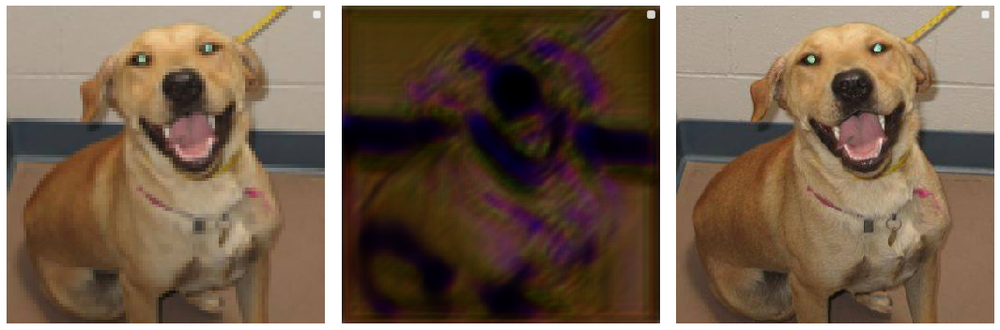

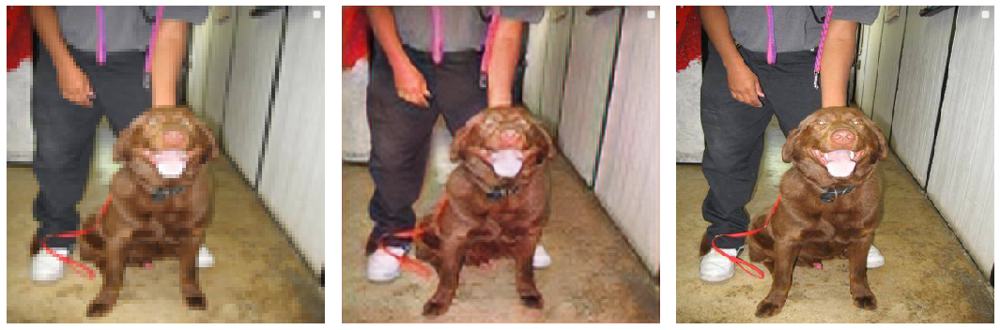

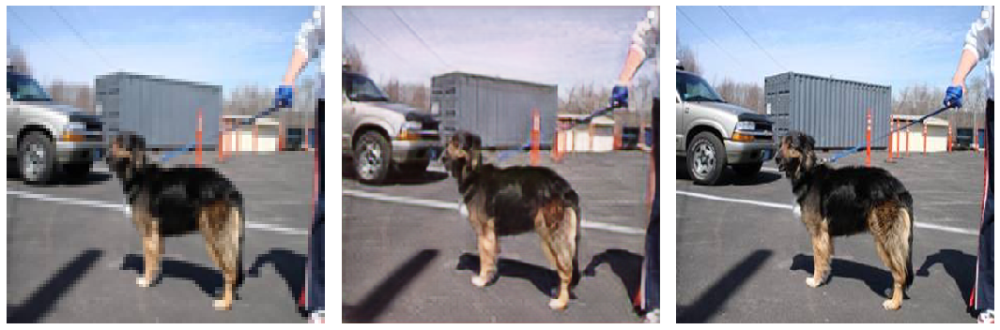

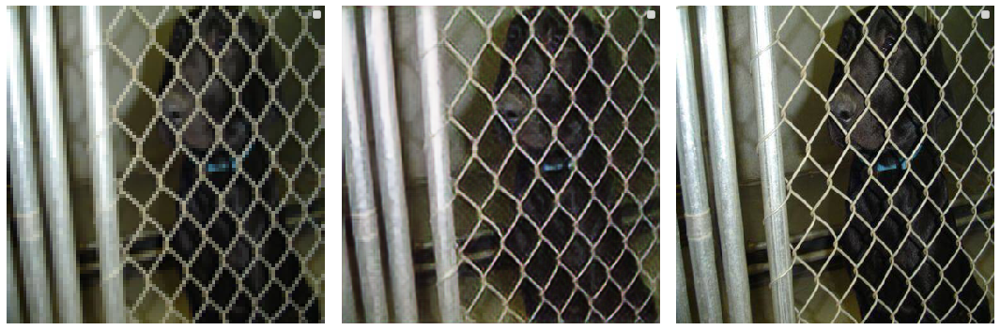

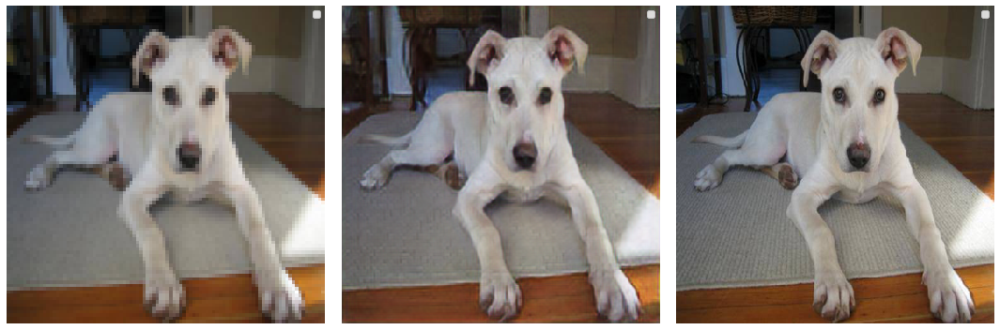

...

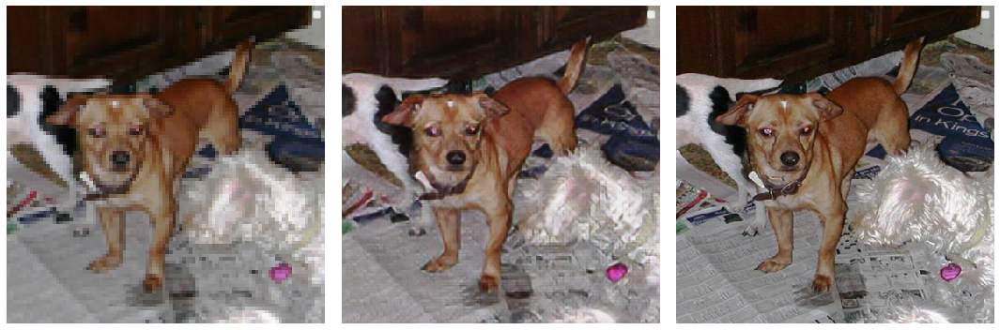

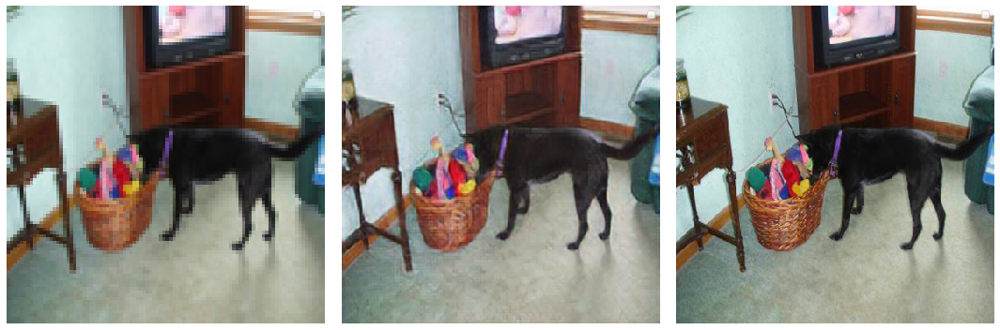

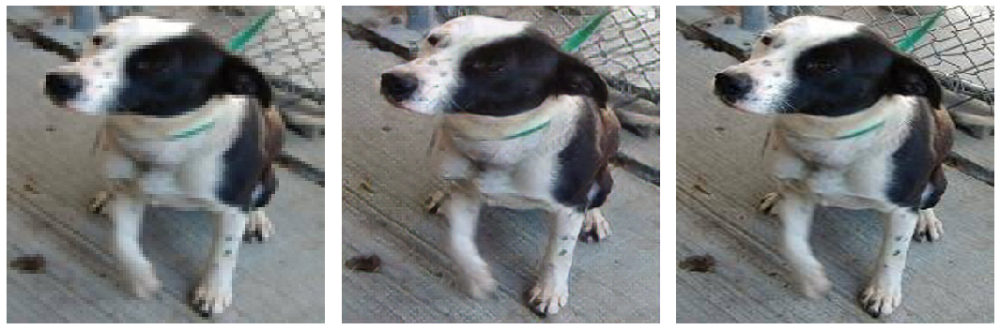

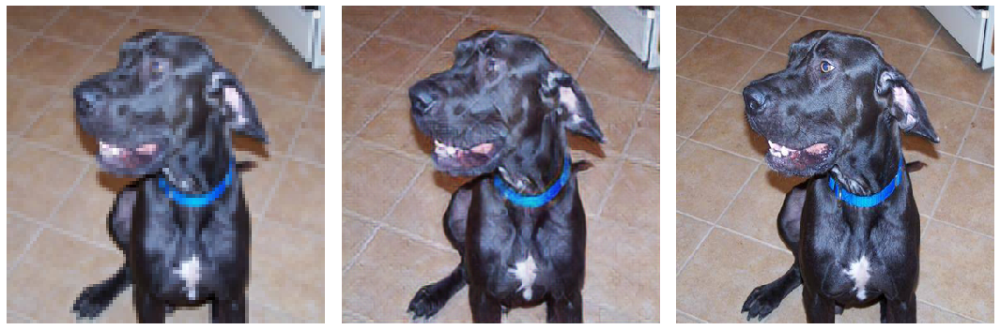

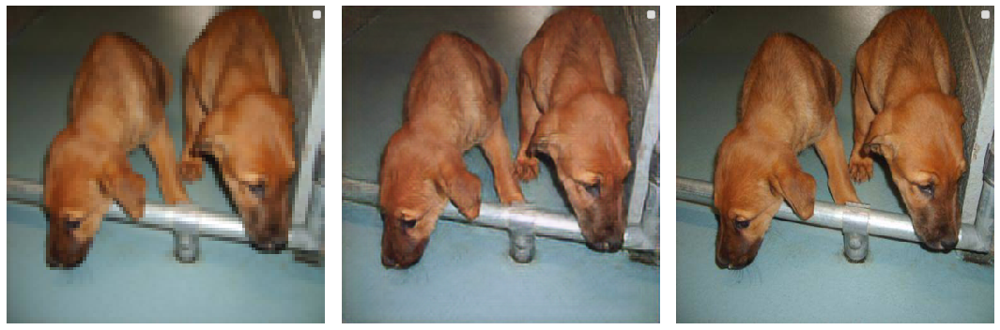

In [0]:
train(100,8)

In [0]:
def plot_test_generated_images_for_model(output_dir, generator, x_test_hr, x_test_lr , dim=(1, 3), figsize=(15, 5)):
    
    examples = x_test_hr.shape[0]
    image_batch_hr = denormalize(x_test_hr)
    image_batch_lr = x_test_lr
    gen_img = generator.predict(image_batch_lr)
    generated_image = denormalize(gen_img)
    image_batch_lr = denormalize(image_batch_lr)
    
    for index in range(examples):
    
        plt.figure(figsize=figsize)
    
        plt.subplot(dim[0], dim[1], 1)
        plt.imshow(image_batch_lr[index], interpolation='nearest')
        plt.axis('off')
        
        plt.subplot(dim[0], dim[1], 2)
        plt.imshow(generated_image[index], interpolation='nearest')
        plt.axis('off')
    
        plt.subplot(dim[0], dim[1], 3)
        plt.imshow(image_batch_hr[index], interpolation='nearest')
        plt.axis('off')
    
        plt.tight_layout()
        plt.savefig(output_dir + 'test_generated_image_%d.png' % index)
    
        #plt.show()

In [0]:
def plot_test_generated_images(output_dir, generator, x_test_lr, figsize=(5, 5)):
    
    examples = x_test_lr.shape[0]
    image_batch_lr = denormalize(x_test_lr)
    gen_img = generator.predict(image_batch_lr)
    generated_image = denormalize(gen_img)
    
    for index in range(examples):
    
        #plt.figure(figsize=figsize)
    
        plt.imshow(generated_image[index], interpolation='nearest')
        plt.axis('off')
        
        plt.tight_layout()
        plt.savefig(output_dir + 'high_res_result_image_%d.png' % index)
    
        #plt.show()

In [0]:
#Test
def test_model(model,output_dir, x_test_hr, x_test_lr):

  plot_test_generated_images_for_model(output_dir, model, x_test_hr, x_test_lr)



In [0]:
from tensorflow.keras.models import load_model
model = load_model('./output/gen_model10.h5', custom_objects={'vgg_loss': vgg_loss})

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if sys.path[0] == '':


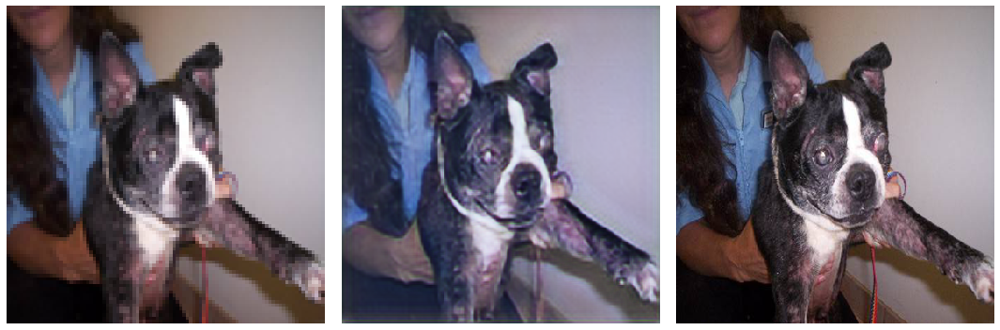

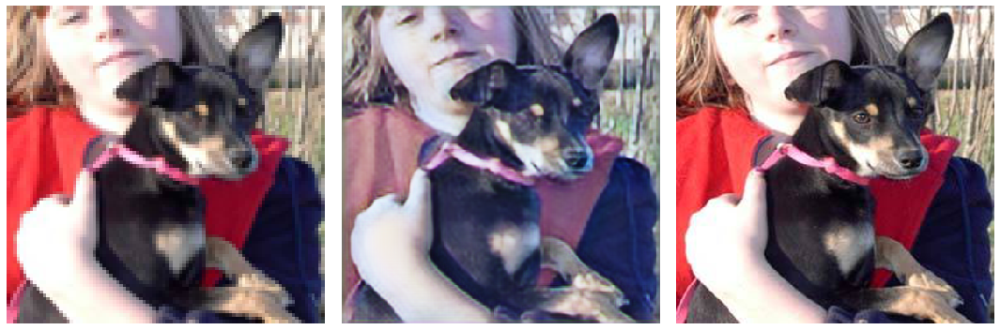

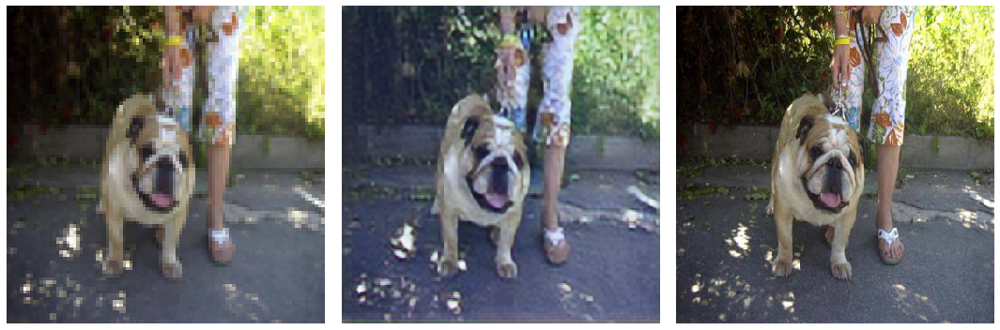

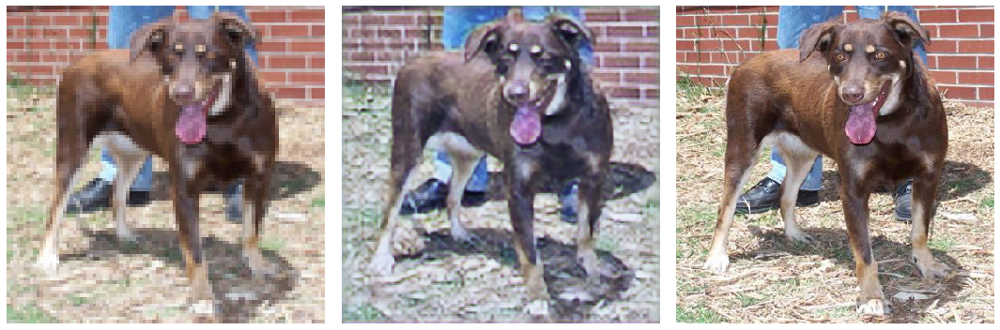

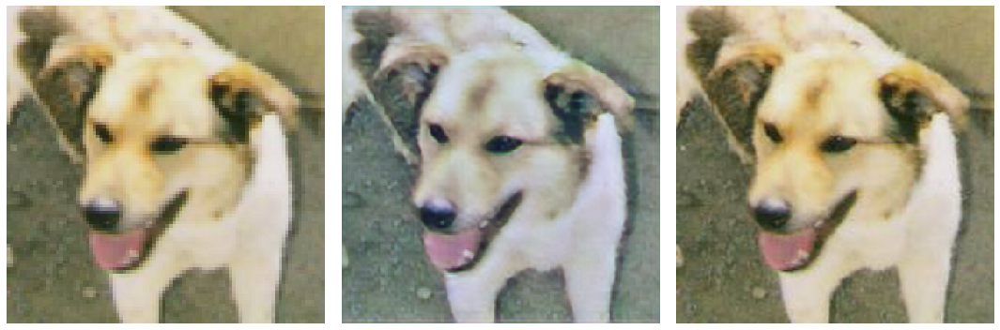

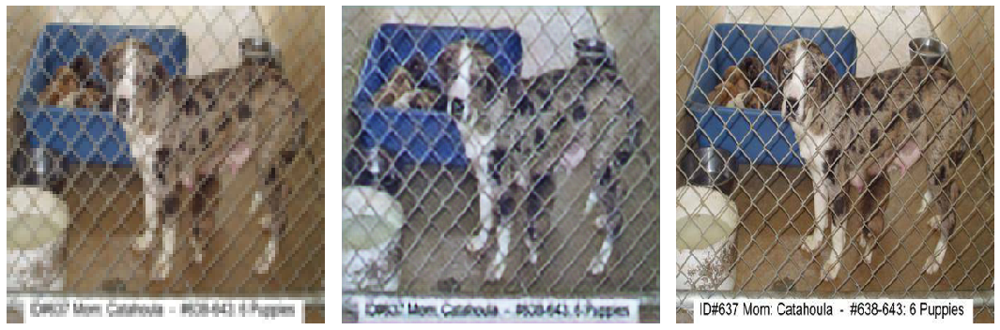

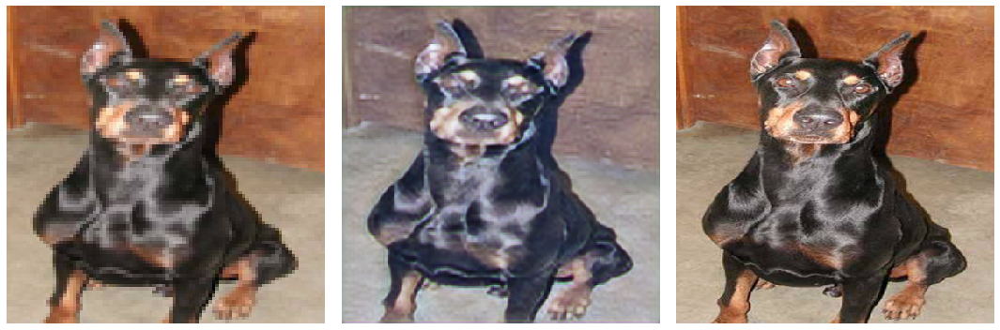

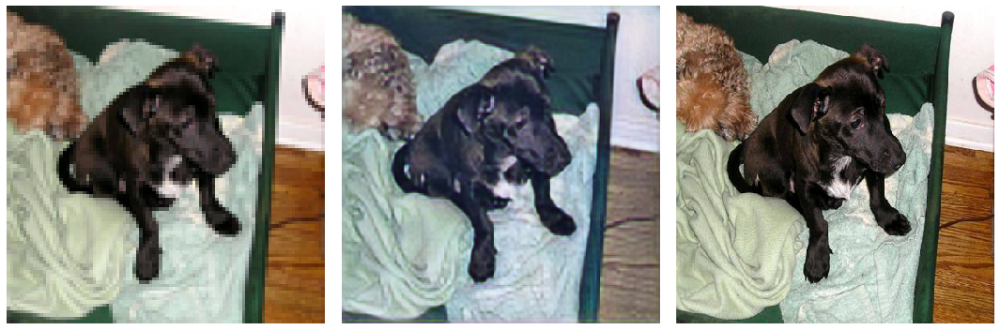

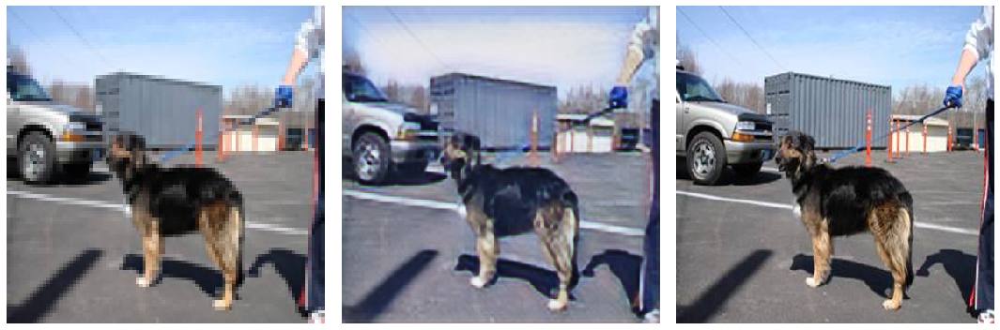

In [0]:
# testando el modelo
path_out = './output'
test_model(model, path_out, x_test_hr, x_test_lr )